In [24]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import os
from scipy.io import loadmat, savemat
from scipy.interpolate import interp1d
import time
from scipy.interpolate import CubicSpline
def db2mag(db): return np.power(10, db/20)

In [25]:
# section for fitting. no need to install
from resonator_tools import circuit
from resonator_tools.circuit import notch_port

<div style="text-align: center; font-size: 45px; color: blue;">
    S7W4
</div>

# Fit

In [36]:
global_address = r"C:\Users\mukha\Documents\Python Scripts\Kantele\Kantele_git\Data\Temperature_sweep\Raw_data" 
sample_folders = os.listdir(global_address)
for sample_i in range(len(sample_folders)):
    if ".PNG" in sample_folders[sample_i]: pass
    else: 
        print(r"[%d]" %(sample_i), '----------->', sample_folders[sample_i]) 

[0] -----------> S11W6
[1] -----------> S18W11
[2] -----------> S5W2.7
[3] -----------> S7W4


In [37]:
sample_i_selected = 3
sample_address = global_address+"\\"+sample_folders[sample_i_selected]
sample_measurements = os.listdir(sample_address)
for meas_i in range(len(sample_measurements)):
    if ".PNG" in sample_measurements[meas_i]: pass
    else: 
        print(r"[%d]" %(meas_i), '----------->', sample_measurements[meas_i]) 

[0] -----------> Range_1
[1] -----------> Range_4


In [38]:
measurement_i_selected = 1
sample_measurement_address = sample_address+"\\"+sample_measurements[measurement_i_selected]
sample_measurement_data = os.listdir(sample_measurement_address)
for i in range(len(sample_measurement_data)):
    if ".PNG" in sample_measurement_data[i]: pass
    else: 
        print(r"[%d]" %(i), '----------->', sample_measurement_data[i]) 

[0] -----------> TEMP_SCAN_range_4_res_0.mat
[1] -----------> TEMP_SCAN_range_4_res_1.mat
[2] -----------> TEMP_SCAN_range_4_res_2.mat
[3] -----------> TEMP_SCAN_range_4_res_3.mat
[4] -----------> TEMP_SCAN_range_4_res_4.mat
[5] -----------> TEMP_SCAN_range_4_res_5.mat
[6] -----------> TEMP_SCAN_range_4_res_6.mat
[7] -----------> TEMP_SCAN_range_4_res_7.mat
[8] -----------> TEMP_SCAN_range_4_res_8.mat
[9] -----------> TEMP_SCAN_range_4_res_9.mat


In [29]:
resonator = 0
file_address = sample_measurement_address+"\\"+sample_measurement_data[resonator]
print(file_address[60:])
mat = loadmat(file_address)
mat.keys()

Data\Temperature_sweep\Raw_data\S7W4\Range_4\TEMP_SCAN_range_4_res_0.mat


dict_keys(['__header__', '__version__', '__globals__', 'add_att_inside', 'powers', 'vna', 'mags', 'phas', 'temps'])

In [7]:
print(mat['add_att_inside'][0][0])
print(mat['vna'][0])
start_freq = mat['vna'][0][0][2][0][0]
stop_freq = mat['vna'][0][0][3][0][0]
nop = mat['vna'][0][0][4][0][0]
freqs = np.linspace(start_freq, stop_freq, nop)
print(len(freqs))
power = mat['powers'][0][0]
print(power)
phas = mat['phas'][:,:nop]
print(phas.shape)
mags = mat['mags'][:,:nop]
print(mags.shape)
temps = mat['temps'][0]
print(mags.shape)

20
[(array([[4.61609079e+09]]), array([[300000.]]), array([[4.61594079e+09]]), array([[4.61624079e+09]]), array([[2001]]), array([[18.49]]), array([[20]]), array([[-30]]), array([[0]]), array([[1]]))]
2001
-30.0
(53, 2001)
(53, 2001)
(53, 2001)


In [33]:
temps

array([1.10847, 1.10847, 1.10847, 1.47218, 1.54449, 1.54464, 1.54464,
       1.72011])

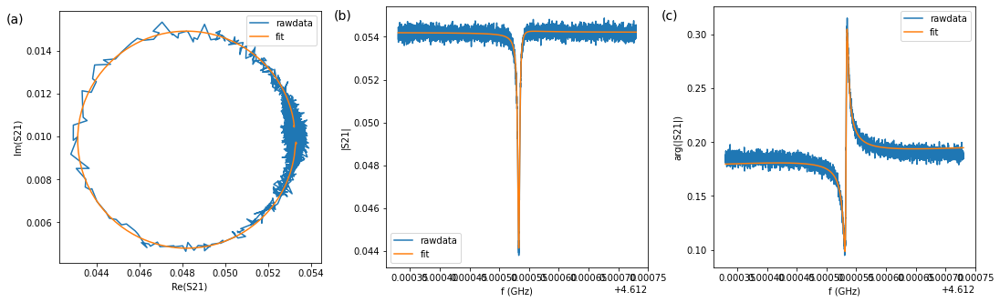

{'Qi_dia_corr': 1405183.7502538466,
 'Qi_no_corr': 1408368.6953991011,
 'absQc': 6128208.071720275,
 'Qc_dia_corr': 6189249.397875652,
 'Ql': 1145185.2311459666,
 'fr': 4612533046.621217,
 'theta0': 3.001031417226313,
 'phi0': -0.1405612363634804,
 'phi0_err': 0.007745615983542365,
 'Ql_err': 11255.959777294498,
 'absQc_err': 41410.920324065606,
 'fr_err': 21.38840717130252,
 'chi_square': 3.4908340993520616e-05,
 'Qi_no_corr_err': 15712.036170268195,
 'Qi_dia_corr_err': 15665.456801138898}

In [36]:
# testing fit
# %matplotlib qt
power_num = -1
S21 = db2mag(mags[power_num])*np.exp(1j*(phas[power_num]))
port1 = notch_port(freqs, S21)
port1.autofit()
port1.plotall()
port1.fitresults

# Fit all powers for all resonators

In [11]:
%matplotlib inline

NEW RESONATOR -->  0
0 --> NEW TEMP: 1.48663
0.0021793633202360496
-------> 1st Fit
1 --> NEW TEMP: 1.70324
0.002112823382804052
-------> 1st Fit
2 --> NEW TEMP: 1.73934
0.0021678228803967414
-------> 1st Fit
3 --> NEW TEMP: 1.91822
0.002146963318432782
-------> 1st Fit
4 --> NEW TEMP: 1.9981
0.0021332312195445624
-------> 1st Fit
5 --> NEW TEMP: 2.00211
0.002113251414211703
-------> 1st Fit
6 --> NEW TEMP: 2.0931
0.0021032854858065164
-------> 1st Fit
7 --> NEW TEMP: 2.12867
0.0021083803886234875
-------> 1st Fit
8 --> NEW TEMP: 2.20749
0.0020986249056607065
-------> 1st Fit
9 --> NEW TEMP: 2.26391
0.0020942474209446615
-------> 1st Fit
10 --> NEW TEMP: 2.29451
0.0020924782393727526
-------> 1st Fit
11 --> NEW TEMP: 2.37514
0.002085158799018494
-------> 1st Fit
12 --> NEW TEMP: 2.39756
0.002082995418465572
-------> 1st Fit
13 --> NEW TEMP: 2.49671
0.0020843833751706953
-------> 1st Fit
14 --> NEW TEMP: 2.4969
0.002076207253646878
-------> 1st Fit
15 --> NEW TEMP: 2.6458
0.002070097728

C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)



16 --> NEW TEMP: 2.75479
0.002048235686350708
-------> 1st Fit
17 --> NEW TEMP: 2.88088
New fit
0.002035386093396596
-------> 2nd Fit
18 --> NEW TEMP: 3.01844
0.0020181189581247594
-------> 1st Fit
19 --> NEW TEMP: 3.14737
New fit


C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last five Jacobian evaluations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Documents\Python Scripts\Kantele\Kantele_git\Scripts\resonator_tools\circlefit.py:165: RuntimeWarning: invalid value encountered in sqrt
  r0 = 1./(2.*np.absolute(A_vec[0]))*np.sqrt(A_vec[1]*A_vec[1]+A_vec[2]*A_vec[2]-4.*A_vec[0]*A_vec[3])


20 --> NEW TEMP: 3.20109
21 --> NEW TEMP: 3.20109
0.0019294191209340283
-------> 1st Fit
22 --> NEW TEMP: 3.20109
0.0019294191209340283
-------> 1st Fit
23 --> NEW TEMP: 3.20109
0.0019294191209340283
-------> 1st Fit
24 --> NEW TEMP: 3.20109


<ipython-input-39-b573fa5f6fd5>:66: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15, 7), sharex = True)
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Documents\Python Scripts\Kantele\Kantele_git\Scripts\resonator_tools\circlefit.py:165: RuntimeWarning: invalid value encountered in sqrt
  r0 = 1./(2.*np.absolute(A_vec[0]))*np.sqrt(A_vec[1]*A_vec[1]+A_vec[2]*A_vec[2]-4.*A_vec[0]*A_vec[3])
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good 

0.0019294191209340283
-------> 1st Fit
25 --> NEW TEMP: 3.24027
---> Just plotted
26 --> NEW TEMP: 3.38868
New fit
0.001976284150249974

C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:881: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Documents\Python Scripts\Kantele\Kantele_git\Scripts\resonator_tools\circlefit.py:165: RuntimeWarning: invalid value encountered in sqrt
  r0 = 1./(2.*np.absolute(A_vec[0]))*np.sqrt(A_vec[1]*A_vec[1]+A_vec[2]*A_vec[2]-4.*A_vec[0]*A_vec[3])
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\op


-------> 2nd Fit
27 --> NEW TEMP: 3.51264
0.0019902960864870423
-------> 1st Fit
28 --> NEW TEMP: 3.62681
New fit


C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:881: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last five Jacobian evaluations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:881: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175:

29 --> NEW TEMP: 3.78392
---> Just plotted
30 --> NEW TEMP: 3.90233


C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last five Jacobian evaluations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Documents\Python Scripts\Kantele\Kantele_git\Scripts\resonator_tools\circlefit.py:165: RuntimeWarning: invalid value encountered in sqrt
  r0 = 1./(2.*np.absolute(A_vec[0]))*np.sqrt(A_vec[1]*A_vec[1]+A_vec[2]*A_vec[2]-4.*A_vec[0]*A_vec[3])
C:\Users\mukha\Documents\Python Scripts\Kantele\Kantele_git\Scripts\resonator_tools\circuit.py:350: RuntimeWarning: invalid value encountered in divide
  return (z_data-A2*(f_data-frcal))/amp_norm*np.exp(1j*(-alpha+2.*np.pi*delay*f_data))
C:\Users\mukha\Anac

New fit
Fatal error
31 --> NEW TEMP: 3.9506
New fit
Fatal error
Data\Temperature_sweep\Fitted_data\S7W4\Range_4\Circlefit_res_0.mat
NEW RESONATOR -->  1
0 --> NEW TEMP: 1.47097
0.18838332996744533
-------> 1st Fit
1 --> NEW TEMP: 1.70221
0.188319156478709
-------> 1st Fit
2 --> NEW TEMP: 1.73934
0.1883654312246792
-------> 1st Fit
3 --> NEW TEMP: 1.92494
0.18833275035302854
-------> 1st Fit
4 --> NEW TEMP: 1.99087
0.18835947000832753
-------> 1st Fit
5 --> NEW TEMP: 2.00371
0.1883126242005968
-------> 1st Fit
6 --> NEW TEMP: 2.0992
0.1882989819247607
-------> 1st Fit
7 --> NEW TEMP: 2.13252
0.18827044956463101
-------> 1st Fit
8 --> NEW TEMP: 2.20786
0.18830310873592193


C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


-------> 1st Fit
9 --> NEW TEMP: 2.25739
0.18830793402006396
-------> 1st Fit
10 --> NEW TEMP: 2.3004
0.18828918820096074
-------> 1st Fit
11 --> NEW TEMP: 2.37289


C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last five Jacobian evaluations.
  warnings.warn(msg, RuntimeWarning)


New fit
0.18826680618044378
-------> 2nd Fit
12 --> NEW TEMP: 2.38773
New fit
13 --> NEW TEMP: 2.49823


C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last five Jacobian evaluations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last five Jacobian evaluations.
  warnings.warn(msg, RuntimeWarning)


0.18828843687219088
-------> 1st Fit
14 --> NEW TEMP: 2.64533
0.18826292194960104
-------> 1st Fit
15 --> NEW TEMP: 2.7481
New fit


C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last five Jacobian evaluations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Documents\Python Scripts\Kantele\Kantele_git\Scripts\resonator_tools\circlefit.py:165: RuntimeWarning: invalid value encountered in sqrt
  r0 = 1./(2.*np.absolute(A_vec[0]))*np.sqrt(A_vec[1]*A_vec[1]+A_vec[2]*A_vec[2]-4.*A_vec[0]*A_vec[3])


0.18820656526563884
-------> 2nd Fit
16 --> NEW TEMP: 2.87055
New fit
Fatal error
17 --> NEW TEMP: 3.01799
---> Just plotted
18 --> NEW TEMP: 3.14464


C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:881: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\mukha\Documents\Python Scripts\Kantele\Kantele_git\Scripts\resonator_tools\circlefit.py:165: RuntimeWarning: invalid value encountered in sqrt
  r0 = 1./(2.*np.absolute(A_vec[0]))*np.sqrt(A_vec[1]*A_vec[1]+A_vec[2]*A_vec[2]-4.*A_vec[0]*A_vec[3])
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:881: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.p

New fit
19 --> NEW TEMP: 3.22748
20 --> NEW TEMP: 3.26251
---> Just plotted
21 --> NEW TEMP: 3.38874
---> Just plotted
22 --> NEW TEMP: 3.52309


C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:881: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Documents\Python Scripts\Kantele\Kantele_git\Scripts\resonator_tools\circlefit.py:165: RuntimeWarning: invalid value encountered in sqrt
  r0 = 1./(2.*np.absolute(A_vec[0]))*np.sqrt(A_vec[1]*A_vec[1]+A_vec[2]*A_vec[2]-4.*A_vec[0]*A_vec[3])
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:881: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.p

---> Just plotted
23 --> NEW TEMP: 3.64816
---> Just plotted
24 --> NEW TEMP: 3.76753
---> Just plotted
25 --> NEW TEMP: 3.87043


C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:881: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last five Jacobian evaluations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Documents\Python Scripts\Kantele\Kantele_git\Scripts\resonator_tools\circlefit.py:165: RuntimeWarning: invalid value encountered in sqrt
  r0 = 1./(2.*np.absolute(A_vec[0]))*np.sqrt(A_vec[1]*A_vec[1]+A_vec[2]*A_vec[2]-4.*A_vec[0]*A_vec[3])
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Anaconda3\lib\site-packag

---> Just plotted
26 --> NEW TEMP: 3.99903
---> Just plotted
Data\Temperature_sweep\Fitted_data\S7W4\Range_4\Circlefit_res_1.mat
NEW RESONATOR -->  2
0 --> NEW TEMP: 1.4829
0.38545323963832523
-------> 1st Fit
1 --> NEW TEMP: 1.69575
0.3854130367735191
-------> 1st Fit
2 --> NEW TEMP: 1.76136
0.38544074385513305
-------> 1st Fit
3 --> NEW TEMP: 1.91545
0.38541764873117046
-------> 1st Fit
4 --> NEW TEMP: 2.00259
0.3854078285073337
-------> 1st Fit
5 --> NEW TEMP: 2.00646
0.385437032438424
-------> 1st Fit
6 --> NEW TEMP: 2.09971
0.3854019310903798
-------> 1st Fit
7 --> NEW TEMP: 2.11969
0.38539615822105144
-------> 1st Fit
8 --> NEW TEMP: 2.19922
0.3853952523380135
-------> 1st Fit
9 --> NEW TEMP: 2.24282
0.385390069715716
-------> 1st Fit
10 --> NEW TEMP: 2.31012
0.3853893467872327
-------> 1st Fit
11 --> NEW TEMP: 2.36929
0.38537983420352084
-------> 1st Fit
12 --> NEW TEMP: 2.41287
0.38538231107013043
-------> 1st Fit
13 --> NEW TEMP: 2.50604
0.38537251281347906
-------> 1st Fit
14

C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


0.38536579501039103
-------> 1st Fit
15 --> NEW TEMP: 2.73297
New fit
0.3853461280210464
-------> 2nd Fit
16 --> NEW TEMP: 2.88441


C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Documents\Python Scripts\Kantele\Kantele_git\Scripts\resonator_tools\circlefit.py:165: RuntimeWarning: invalid value encountered in sqrt
  r0 = 1./(2.*np.absolute(A_vec[0]))*np.sqrt(A_vec[1]*A_vec[1]+A_vec[2]*A_vec[2]-4.*A_vec[0]*A_vec[3])
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last five Jacobian evaluations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Docum

---> Just plotted
17 --> NEW TEMP: 2.99799
---> Just plotted
18 --> NEW TEMP: 3.13455
New fit


C:\Users\mukha\Documents\Python Scripts\Kantele\Kantele_git\Scripts\resonator_tools\circlefit.py:165: RuntimeWarning: invalid value encountered in sqrt
  r0 = 1./(2.*np.absolute(A_vec[0]))*np.sqrt(A_vec[1]*A_vec[1]+A_vec[2]*A_vec[2]-4.*A_vec[0]*A_vec[3])
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:881: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\op

Fatal error
19 --> NEW TEMP: 3.23121
0.38531701049346356
-------> 1st Fit
20 --> NEW TEMP: 3.397
---> Just plotted
21 

C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:881: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Documents\Python Scripts\Kantele\Kantele_git\Scripts\resonator_tools\circlefit.py:165: RuntimeWarning: invalid value encountered in sqrt
  r0 = 1./(2.*np.absolute(A_vec[0]))*np.sqrt(A_vec[1]*A_vec[1]+A_vec[2]*A_vec[2]-4.*A_vec[0]*A_vec[3])
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\op

--> NEW TEMP: 3.51973


C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:476: RuntimeWarning: Number of calls to function has reached maxfev = 400.
  warnings.warn(errors[info][0], RuntimeWarning)
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:476: RuntimeWarning: Number of calls to function has reached maxfev = 800.
  warnings.warn(errors[info][0], RuntimeWarning)
C:\Users\mukha\Documents\Python Scripts\Kantele\Kantele_git\Scripts\resonator_tools\circuit.py:381: RuntimeWarning: invalid value encountered in scalar divide
  Qc = 1./(1./complQc).real	# here, taking the real part of (1/complQc) from diameter correction method
C:\Users\mukha\Documents\Python Scripts\Kantele\Kantele_git\Scripts\resonator_tools\circlefit.py:320: RuntimeWarning: invalid value encountered in divide
  err = y - (  ( 1. - (Ql/float(absQc)*np.exp(1j*phi0))/(1+2j*Ql*(x-fr)/float(fr)) )  )
C:\Users\mukha\Documents\Python Scripts\Kantele\Kantele_git\Scripts\resonator_tools\circlefit.py:365:

New fit
Fatal error
22 --> NEW TEMP: 3.63373
New fit
Fatal error
23 --> NEW TEMP: 3.74345
0.3853599408185646
-------> 1st Fit
24 --> NEW TEMP: 3.85457
New fit


C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:881: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Documents\Python Scripts\Kantele\Kantele_git\Scripts\resonator_tools\circlefit.py:165: RuntimeWarning: invalid value encountered in sqrt
  r0 = 1./(2.*np.absolute(A_vec[0]))*np.sqrt(A_vec[1]*A_vec[1]+A_vec[2]*A_vec[2]-4.*A_vec[0]*A_vec[3])


25 --> NEW TEMP: 3.99931


C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:881: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last five Jacobian evaluations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Documents\Python Scripts\Kantele\Kantele_git\Scripts\resonator_tools\circuit.py:374: RuntimeWarning: invalid value encountered in arcsin
  phi0 = -np.arcsin(yc/r0)
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:476: RuntimeWarning: Number of calls to fun

New fit
Data\Temperature_sweep\Fitted_data\S7W4\Range_4\Circlefit_res_2.mat
NEW RESONATOR -->  3
0 --> NEW TEMP: 1.49043
0.6034078040992616
-------> 1st Fit
1 --> NEW TEMP: 1.69484
0.6033665552050014
-------> 1st Fit
2 --> NEW TEMP: 1.73648
0.6033947323071356
-------> 1st Fit
3 --> NEW TEMP: 1.91853
0.6033701455666547
-------> 1st Fit
4 --> NEW TEMP: 1.99351
0.6033913902986985
-------> 1st Fit
5 --> NEW TEMP: 2.0089
0.6033614117460031
-------> 1st Fit
6 --> NEW TEMP: 2.10569
0.6033526921786727
-------> 1st Fit
7 --> NEW TEMP: 2.12389
0.6033494405947417
-------> 1st Fit
8 --> NEW TEMP: 2.19973
0.6033507997725671
-------> 1st Fit
9 --> NEW TEMP: 2.24258
0.6033429681287243
-------> 1st Fit
10 --> NEW TEMP: 2.30515
0.6033409938121608
-------> 1st Fit
11 --> NEW TEMP: 2.38817
0.6033290977438179
-------> 1st Fit
12 --> NEW TEMP: 2.40299
0.6033366745441633
-------> 1st Fit
13 --> NEW TEMP: 2.50576


C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last five Jacobian evaluations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last five Jacobian evaluations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Anaconda3\l

0.6033229074981907
-------> 1st Fit
14 --> NEW TEMP: 2.62713
0.6033141095365409
-------> 1st Fit
15 --> NEW TEMP: 2.75745
0.6032913210764388
-------> 1st Fit
16 --> NEW TEMP: 2.84276
0.6032792385164436
-------> 1st Fit
17 --> NEW TEMP: 3.00019
New fit


C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last five Jacobian evaluations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


18 --> NEW TEMP: 3.12741
---> Just plotted
19 --> NEW TEMP: 3.26194
0.603214560842007
-------> 1st Fit
20 --> NEW TEMP: 3.35033
---> Just plotted
21 --> NEW TEMP: 3.53263


C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Documents\Python Scripts\Kantele\Kantele_git\Scripts\resonator_tools\circlefit.py:165: RuntimeWarning: invalid value encountered in sqrt
  r0 = 1./(2.*np.absolute(A_vec[0]))*np.sqrt(A_vec[1]*A_vec[1]+A_vec[2]*A_vec[2]-4.*A_vec[0]*A_vec[3])
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last five Jacobian evaluations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Anaco

New fit
Fatal error
22 --> NEW TEMP: 3.64219


C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:476: RuntimeWarning: Number of calls to function has reached maxfev = 400.
  warnings.warn(errors[info][0], RuntimeWarning)
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:476: RuntimeWarning: Number of calls to function has reached maxfev = 800.
  warnings.warn(errors[info][0], RuntimeWarning)
C:\Users\mukha\Documents\Python Scripts\Kantele\Kantele_git\Scripts\resonator_tools\circuit.py:381: RuntimeWarning: invalid value encountered in scalar divide
  Qc = 1./(1./complQc).real	# here, taking the real part of (1/complQc) from diameter correction method
C:\Users\mukha\Documents\Python Scripts\Kantele\Kantele_git\Scripts\resonator_tools\circlefit.py:320: RuntimeWarning: invalid value encountered in divide
  err = y - (  ( 1. - (Ql/float(absQc)*np.exp(1j*phi0))/(1+2j*Ql*(x-fr)/float(fr)) )  )
C:\Users\mukha\Documents\Python Scripts\Kantele\Kantele_git\Scripts\resonator_tools\circlefit.py:365:

New fit
Fatal error
23 --> NEW TEMP: 3.71958
---> Just plotted
24 --> NEW TEMP: 3.88013
---> Just plotted
25 --> NEW TEMP: 4.00644
---> Just plotted


C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:881: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Documents\Python Scripts\Kantele\Kantele_git\Scripts\resonator_tools\circlefit.py:165: RuntimeWarning: invalid value encountered in sqrt
  r0 = 1./(2.*np.absolute(A_vec[0]))*np.sqrt(A_vec[1]*A_vec[1]+A_vec[2]*A_vec[2]-4.*A_vec[0]*A_vec[3])
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:881: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.p

Data\Temperature_sweep\Fitted_data\S7W4\Range_4\Circlefit_res_3.mat
NEW RESONATOR -->  4
0 --> NEW TEMP: 1.48877
0.8400538242281179
-------> 1st Fit
1 --> NEW TEMP: 1.69524
0.8400132919838601
-------> 1st Fit
2 --> NEW TEMP: 1.73065
0.8400401120247709
-------> 1st Fit
3 --> NEW TEMP: 1.92423
0.8400143235445121
-------> 1st Fit
4 --> NEW TEMP: 1.9942
0.840036131400792
-------> 1st Fit
5 --> NEW TEMP: 2.0123
0.8400058816417157
-------> 1st Fit
6 --> NEW TEMP: 2.09302
0.8400014856255078
-------> 1st Fit
7 --> NEW TEMP: 2.11793
0.8399990361110881
-------> 1st Fit
8 --> NEW TEMP: 2.20022
0.8399928849347349
-------> 1st Fit
9 --> NEW TEMP: 2.24224
0.8399862197922525
-------> 1st Fit
10 --> NEW TEMP: 2.30734
0.8399922352836064
-------> 1st Fit
11 --> NEW TEMP: 2.3755
0.839972299569351
-------> 1st Fit
12 --> NEW TEMP: 2.3859
0.8399800034181046
-------> 1st Fit
13 --> NEW TEMP: 2.51155
0.8399764145768316
-------> 1st Fit
14 --> NEW TEMP: 2.62894
0.839958838470058
-------> 1st Fit
15 --> NEW TE

C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


0.8398823669534972
-------> 1st Fit
18 --> NEW TEMP: 3.14336
New fit
Fatal error
19 --> NEW TEMP: 3.27202
---> Just plotted
20 --> NEW TEMP: 3.36681


C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last five Jacobian evaluations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Documents\Python Scripts\Kantele\Kantele_git\Scripts\resonator_tools\circlefit.py:165: RuntimeWarning: invalid value encountered in sqrt
  r0 = 1./(2.*np.absolute(A_vec[0]))*np.sqrt(A_vec[1]*A_vec[1]+A_vec[2]*A_vec[2]-4.*A_vec[0]*A_vec[3])
C:\Users\mukha\Documents\Python Scripts\Kantele\Kantele_git\Scripts\resonator_tools\circuit.py:350: RuntimeWarning: invalid value encountered in divide
  return (z_data-A2*(f_data-frcal))/amp_norm*np.exp(1j*(-alpha+2.*np.pi*delay*f_data))
C:\Users\mukha\Anac

---> Just plotted
21 --> NEW TEMP: 3.52759
---> Just plotted
22 --> NEW TEMP: 3.59333
---> Just plotted
23 --> NEW TEMP: 3.76877


C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last five Jacobian evaluations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Documents\Python Scripts\Kantele\Kantele_git\Scripts\resonator_tools\circlefit.py:165: RuntimeWarning: invalid value encountered in sqrt
  r0 = 1./(2.*np.absolute(A_vec[0]))*np.sqrt(A_vec[1]*A_vec[1]+A_vec[2]*A_vec[2]-4.*A_vec[0]*A_vec[3])
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:881: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\mukha\Anaconda3\lib\site-packag

---> Just plotted
24 --> NEW TEMP: 3.85844
---> Just plotted
Data\Temperature_sweep\Fitted_data\S7W4\Range_4\Circlefit_res_4.mat
NEW RESONATOR -->  5
0 --> NEW TEMP: 1.48877
1.0990709723495886
-------> 1st Fit
1 --> NEW TEMP: 1.73553
1.0990566371557478
-------> 1st Fit
2 --> NEW TEMP: 1.93226
1.099029294672576
-------> 1st Fit
3 --> NEW TEMP: 1.99227
1.0990248886048093
-------> 1st Fit
4 --> NEW TEMP: 1.99796
1.0990535298702433
-------> 1st Fit
5 --> NEW TEMP: 2.10039
1.0990166413577782
-------> 1st Fit
6 --> NEW TEMP: 2.12061
1.099014962204862
-------> 1st Fit
7 --> NEW TEMP: 2.20827
1.099009810693782
-------> 1st Fit
8 --> NEW TEMP: 2.24337
1.099003527476067
-------> 1st Fit
9 --> NEW TEMP: 2.30213
1.0990069050723514
-------> 1st Fit
10 --> NEW TEMP: 2.38577
1.0989891922906798
-------> 1st Fit
11 --> NEW TEMP: 2.39582
1.0989944956190536
-------> 1st Fit
12 --> NEW TEMP: 2.51174
1.0989925110706835
-------> 1st Fit
13 --> NEW TEMP: 2.65137
1.0989740828315577
-------> 1st Fit
14 --> NEW

C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last five Jacobian evaluations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


-------> 1st Fit
17 --> NEW TEMP: 3.153
1.0988618022683498
-------> 1st Fit
18 --> NEW TEMP: 3.26173
---> Just plotted
19 --> NEW TEMP: 3.38387
1.0989027481011382


C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Documents\Python Scripts\Kantele\Kantele_git\Scripts\resonator_tools\circlefit.py:165: RuntimeWarning: invalid value encountered in sqrt
  r0 = 1./(2.*np.absolute(A_vec[0]))*np.sqrt(A_vec[1]*A_vec[1]+A_vec[2]*A_vec[2]-4.*A_vec[0]*A_vec[3])
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Documents\Python

-------> 1st Fit
20 --> NEW TEMP: 3.50176
---> Just plotted
21 --> NEW TEMP: 3.63728
New fit
Fatal error
22 --> NEW TEMP: 3.7523
---> Just plotted


C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:881: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Documents\Python Scripts\Kantele\Kantele_git\Scripts\resonator_tools\circlefit.py:165: RuntimeWarning: invalid value encountered in sqrt
  r0 = 1./(2.*np.absolute(A_vec[0]))*np.sqrt(A_vec[1]*A_vec[1]+A_vec[2]*A_vec[2]-4.*A_vec[0]*A_vec[3])
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last five Jacobian evaluations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Anaconda3\lib\site-packag

23 --> NEW TEMP: 3.90577
New fit
Fatal error
Data\Temperature_sweep\Fitted_data\S7W4\Range_4\Circlefit_res_5.mat
NEW RESONATOR -->  6
0 --> NEW TEMP: 1.47127
1.3840517361575406
-------> 1st Fit
1 --> NEW TEMP: 1.73495


C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:881: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\mukha\Documents\Python Scripts\Kantele\Kantele_git\Scripts\resonator_tools\circlefit.py:165: RuntimeWarning: invalid value encountered in sqrt
  r0 = 1./(2.*np.absolute(A_vec[0]))*np.sqrt(A_vec[1]*A_vec[1]+A_vec[2]*A_vec[2]-4.*A_vec[0]*A_vec[3])


1.3840367172576302
-------> 1st Fit
2 --> NEW TEMP: 1.93514
1.3840070749231987
-------> 1st Fit
3 --> NEW TEMP: 1.99212
1.3840314618453409
-------> 1st Fit
4 --> NEW TEMP: 1.9938
1.3840034130843613
-------> 1st Fit
5 --> NEW TEMP: 2.09783
1.3839966211927672
-------> 1st Fit
6 --> NEW TEMP: 2.11889
1.3839967701759006
-------> 1st Fit
7 --> NEW TEMP: 2.20546
1.3839912865636705
-------> 1st Fit
8 --> NEW TEMP: 2.24992
1.3839837840630524
-------> 1st Fit
9 --> NEW TEMP: 2.30201
1.3839865391242734
-------> 1st Fit
10 --> NEW TEMP: 2.37704
1.3839689674152051
-------> 1st Fit
11 --> NEW TEMP: 2.40296
1.3839706427218301
-------> 1st Fit
12 --> NEW TEMP: 2.49552
1.3839680858942387
-------> 1st Fit
13 --> NEW TEMP: 2.63147
1.38394999836106
-------> 1st Fit
14 --> NEW TEMP: 2.76066
1.3839185088983905
-------> 1st Fit
15 --> NEW TEMP: 2.87793
1.3839172359303804
-------> 1st Fit
16 --> NEW TEMP: 2.99965
1.3838502746992631
-------> 1st Fit
17 --> NEW TEMP: 3.13099


C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last five Jacobian evaluations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Documents\Python Scripts\Kantele\Kantele_git\Scripts\resonator_tools\circlefit.py:165: RuntimeWarning: invalid value encountered in sqrt
  r0 = 1./(2.*np.absolute(A_vec[0]))*np.sqrt(A_vec[1]*A_vec[1]+A_vec[2]*A_vec[2]-4.*A_vec[0]*A_vec[3])
C:\Users\mukha\Anaco

1.3838280275416004
-------> 1st Fit
18 --> NEW TEMP: 3.2709
New fit
Fatal error
19 --> NEW TEMP: 3.39423
---> Just plotted
20 --> NEW TEMP: 3.50711
---> Just plotted
21 --> NEW TEMP: 3.67593


C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Documents\Python Scripts\Kantele\Kantele_git\Scripts\resonator_tools\circlefit.py:165: RuntimeWarning: invalid value encountered in sqrt
  r0 = 1./(2.*np.absolute(A_vec[0]))*np.sqrt(A_vec[1]*A_vec[1]+A_vec[2]*A_vec[2]-4.*A_vec[0]*A_vec[3])
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Documents\Python Scripts\Kantele\Kantele_git\Scripts\resonator_tools\circlefit.py:165: RuntimeWarning: invalid value encountered in sqrt
  r0 = 1./(2.*np.absolute(A_vec[0]))*np.sqrt(A_vec[1]*A_vec[1]+A_vec[2]*A_vec[2]-4.*A_vec[0]*A_vec[3])
C:\Users\mukha

---> Just plotted
22 --> NEW TEMP: 3.77191
---> Just plotted
23 --> NEW TEMP: 3.84756
New fit


C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Documents\Python Scripts\Kantele\Kantele_git\Scripts\resonator_tools\circlefit.py:165: RuntimeWarning: invalid value encountered in sqrt
  r0 = 1./(2.*np.absolute(A_vec[0]))*np.sqrt(A_vec[1]*A_vec[1]+A_vec[2]*A_vec[2]-4.*A_vec[0]*A_vec[3])
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last five Jacobian evaluations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Documents\Python Scripts\Kantele\Kantele_git\Scripts\resonator_tools\circuit.py:395: RuntimeWarning: invalid value encountered in sqrt
  errors = np.sqrt(np.diagonal(cov))
C:\Users\mukha\Documents\Python Scripts\Kantele\Kantele_git\Scripts\res

Data\Temperature_sweep\Fitted_data\S7W4\Range_4\Circlefit_res_6.mat
NEW RESONATOR -->  7
0 --> NEW TEMP: 1.46788
1.6996351042238764
-------> 1st Fit
1 --> NEW TEMP: 1.73495
1.6996192196194233
-------> 1st Fit
2 --> NEW TEMP: 1.93285
1.6995878534010025
-------> 1st Fit
3 --> NEW TEMP: 2.00607
1.6995876248415769
-------> 1st Fit
4 --> NEW TEMP: 2.00998
1.6996171739639125
-------> 1st Fit
5 --> NEW TEMP: 2.10652
1.699580848330874
-------> 1st Fit
6 --> NEW TEMP: 2.12285
1.6995786686151027
-------> 1st Fit
7 --> NEW TEMP: 2.18802
1.6995801777197999
-------> 1st Fit
8 --> NEW TEMP: 2.25155
1.6995684978928765
-------> 1st Fit
9 --> NEW TEMP: 2.30669
1.6995672097019492
-------> 1st Fit
10 --> NEW TEMP: 2.36314
1.699551210517951
-------> 1st Fit
11 --> NEW TEMP: 2.38723
1.6995607885291752
-------> 1st Fit
12 --> NEW TEMP: 2.52071
1.6995541628626158
-------> 1st Fit
13 --> NEW TEMP: 2.64067
1.699543738441779
-------> 1st Fit
14 --> NEW TEMP: 2.7419
1.6995181136668949
-------> 1st Fit
15 --> NEW

C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last five Jacobian evaluations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


-------> 1st Fit
18 --> NEW TEMP: 3.24358
1.699395940521014
-------> 1st Fit
19 --> NEW TEMP: 3.42285
1.6994023768430893
-------> 1st Fit
20 --> NEW TEMP: 3.48626
---> Just plotted
21 --> NEW TEMP: 3.68451
---> Just plotted
22 --> NEW TEMP: 3.74866
New fit


C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last five Jacobian evaluations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Documents\Python Scripts\Kantele\Kantele_git\Scripts\resonator_tools\circlefit.py:165: RuntimeWarning: invalid value encountered in sqrt
  r0 = 1./(2.*np.absolute(A_vec[0]))*np.sqrt(A_vec[1]*A_vec[1]+A_vec[2]*A_vec[2]-4.*A_vec[0]*A_vec[3])
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Docum

Fatal error
23 --> NEW TEMP: 3.87974
New fit
Fatal error
Data\Temperature_sweep\Fitted_data\S7W4\Range_4\Circlefit_res_7.mat
NEW RESONATOR -->  8
0 --> NEW TEMP: 1.47102
2.048102986182742
-------> 1st Fit
1 --> NEW TEMP: 1.74566


C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last five Jacobian evaluations.
  warnings.warn(msg, RuntimeWarning)


2.0480863631239714
-------> 1st Fit
2 --> NEW TEMP: 1.94519
2.0480514182788587
-------> 1st Fit
3 --> NEW TEMP: 1.99413
2.0480824850219284
-------> 1st Fit
4 --> NEW TEMP: 1.99705


C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:476: RuntimeWarning: Number of calls to function has reached maxfev = 200.
  warnings.warn(errors[info][0], RuntimeWarning)


2.0480518373665317
-------> 1st Fit
5 --> NEW TEMP: 2.09145


C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:476: RuntimeWarning: Number of calls to function has reached maxfev = 200.
  warnings.warn(errors[info][0], RuntimeWarning)


2.0480480576400755
-------> 1st Fit
6 --> NEW TEMP: 2.12774
2.048044503974851
-------> 1st Fit
7 --> NEW TEMP: 2.19413
2.048042838942324
-------> 1st Fit
8 --> NEW TEMP: 2.24785
2.0480349880546616
-------> 1st Fit
9 --> NEW TEMP: 2.29711
2.0480349988324242
-------> 1st Fit
10 --> NEW TEMP: 2.37496
2.0480190985693927
-------> 1st Fit
11 --> NEW TEMP: 2.38467
2.0480305802969063
-------> 1st Fit
12 --> NEW TEMP: 2.52164
2.0480153343619785
-------> 1st Fit
13 --> NEW TEMP: 2.61154
2.048005110623584
-------> 1st Fit
14 --> NEW TEMP: 2.76753
2.047987370319218
-------> 1st Fit
15 --> NEW TEMP: 2.88482
2.047967267758219
-------> 1st Fit
16 --> NEW TEMP: 3.01232
2.047938567845108
-------> 1st Fit
17 --> NEW TEMP: 3.13952
2.047884536468561
-------> 1st Fit
18 --> NEW TEMP: 3.24209


C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:881: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last five Jacobian evaluations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize

New fit
19 --> NEW TEMP: 3.38473
New fit
20 --> NEW TEMP: 3.51672


C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:881: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last five Jacobian evaluations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:881: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175:

New fit
21 --> NEW TEMP: 3.64826
New fit
22 --> NEW TEMP: 3.75873


C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:881: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\mukha\Documents\Python Scripts\Kantele\Kantele_git\Scripts\resonator_tools\circlefit.py:165: RuntimeWarning: invalid value encountered in sqrt
  r0 = 1./(2.*np.absolute(A_vec[0]))*np.sqrt(A_vec[1]*A_vec[1]+A_vec[2]*A_vec[2]-4.*A_vec[0]*A_vec[3])
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last five Jacobian evaluations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Anaconda3\lib\site-packag

---> Just plotted
23 --> NEW TEMP: 3.88539
---> Just plotted
Data\Temperature_sweep\Fitted_data\S7W4\Range_4\Circlefit_res_8.mat
NEW RESONATOR -->  9
0 --> NEW TEMP: 1.47516
2.439790212723044
-------> 1st Fit
1 --> NEW TEMP: 1.74571
2.439772632078408
-------> 1st Fit
2 --> NEW TEMP: 1.94613
2.4397288335426524
-------> 1st Fit
3 --> NEW TEMP: 1.99985
2.439770656774325
-------> 1st Fit
4 --> NEW TEMP: 2.00895
2.439740813336188
-------> 1st Fit
5 --> NEW TEMP: 2.09504
2.439735919166818
-------> 1st Fit
6 --> NEW TEMP: 2.10834
2.4397320927772723
-------> 1st Fit
7 --> NEW TEMP: 2.198
2.4397333476044665
-------> 1st Fit
8 --> NEW TEMP: 2.24836
2.4397228472190235
-------> 1st Fit
9 --> NEW TEMP: 2.30495
2.43972358966374
-------> 1st Fit
10 --> NEW TEMP: 2.37431
2.439708185352016
-------> 1st Fit
11 --> NEW TEMP: 2.40715
2.439712090208907
-------> 1st Fit
12 --> NEW TEMP: 2.50631
2.439703375522285
-------> 1st Fit
13 --> NEW TEMP: 2.6155
2.4396869147557796
-------> 1st Fit
14 --> NEW TEMP: 2.

C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last five Jacobian evaluations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last five Jacobian evaluations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:881: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\mukha\Anaconda3\lib\site-packages\sci

2.4394860027544496
-------> 1st Fit
19 --> NEW TEMP: 3.38834
New fit
20 --> NEW TEMP: 3.49614


C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:881: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last five Jacobian evaluations.
  warnings.warn(msg, RuntimeWarning)
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:881: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
C:\Users\mukha\Anaconda3\lib\site-packages\scipy\optimize\_minpack_py.py:175:

New fit
21 --> NEW TEMP: 3.65621
New fit
Fatal error
22 --> NEW TEMP: 3.78819
New fit
Fatal error
23 --> NEW TEMP: 3.89941
New fit
Data\Temperature_sweep\Fitted_data\S7W4\Range_4\Circlefit_res_9.mat


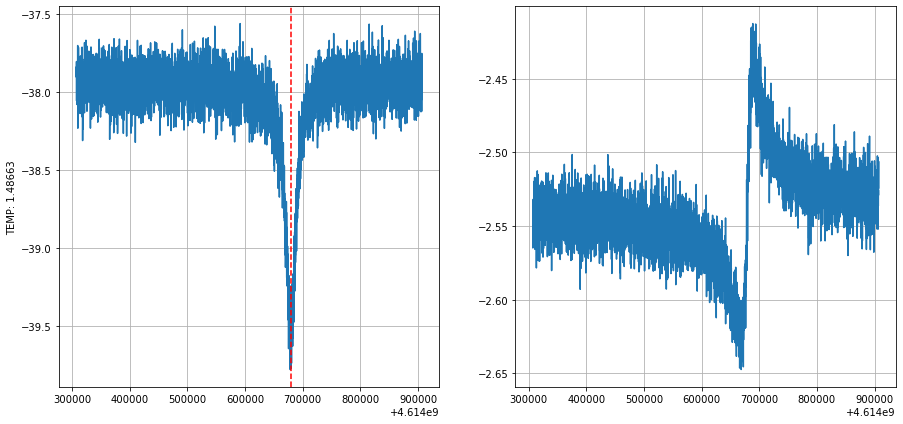

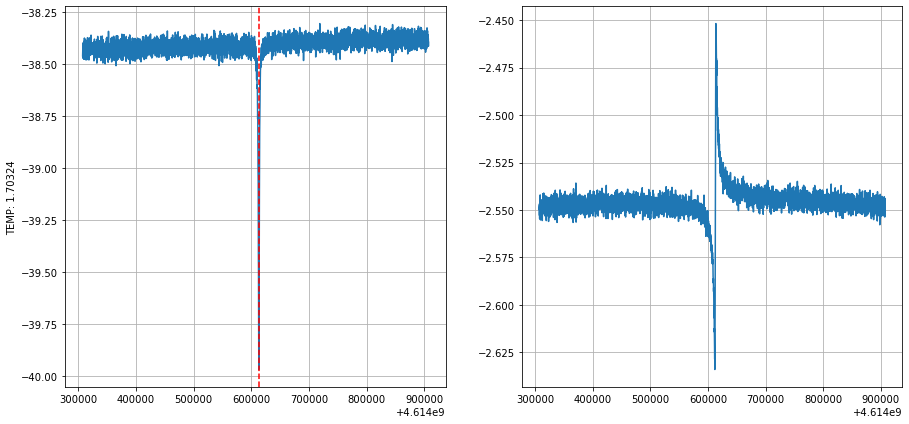

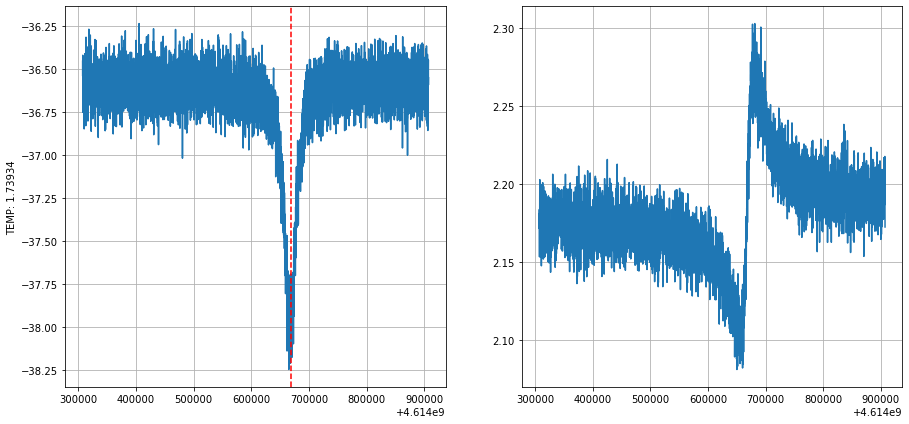

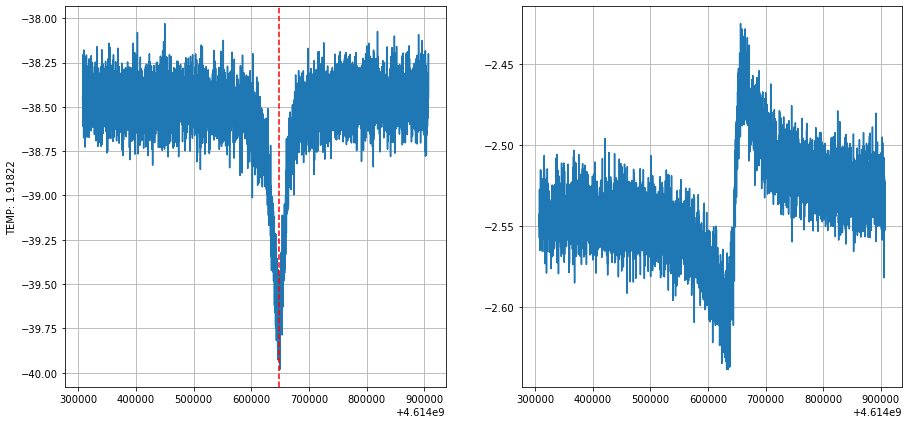

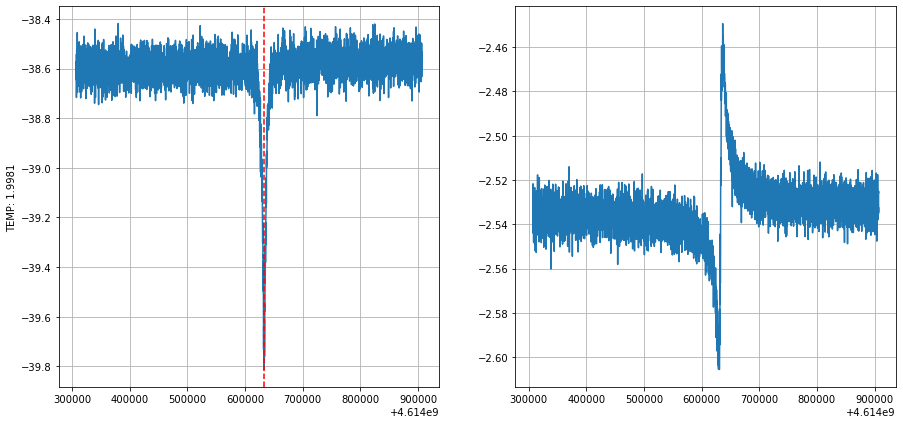

...

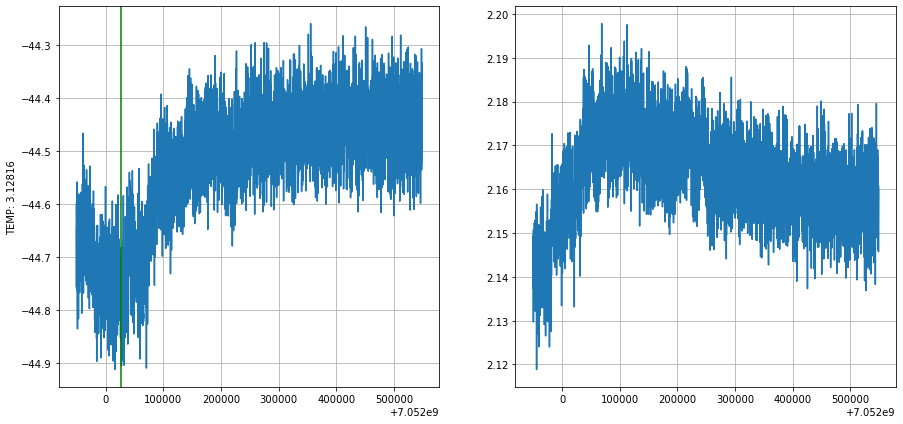

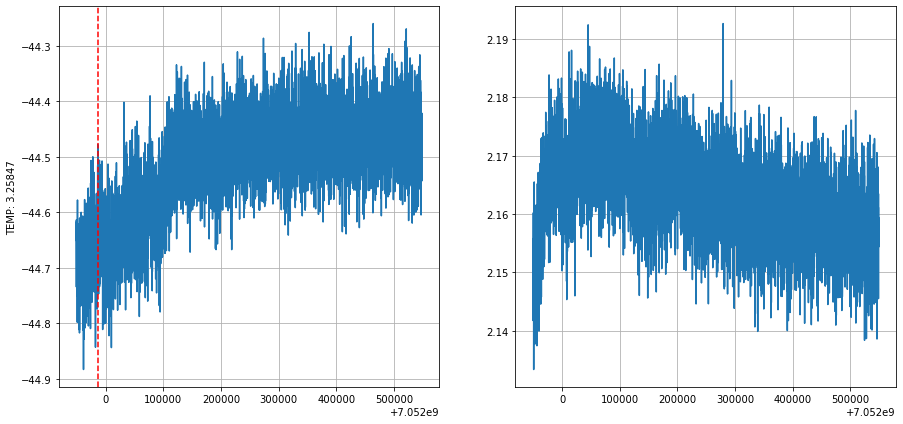

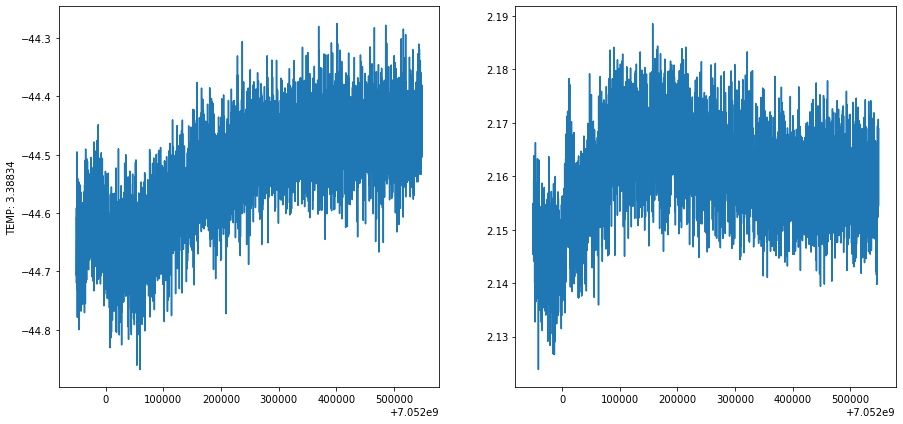

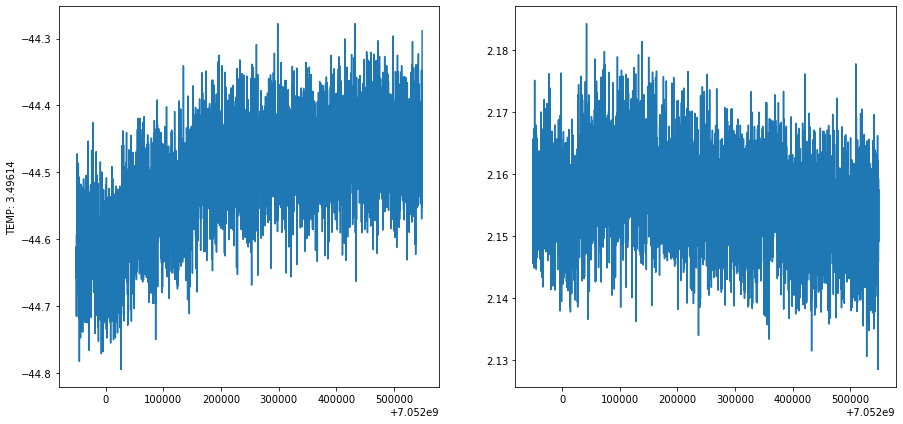

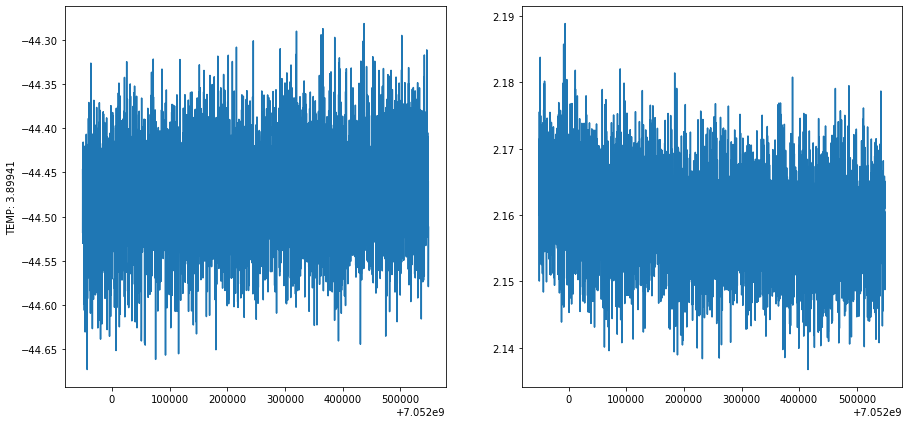

In [39]:
for resonator in range(10):
    print("NEW RESONATOR --> ", resonator)
#     resonator = 1
    file_address_loop = sample_measurement_address+"\\"+sample_measurement_data[resonator]
#     print(file_address_loop[60:])
    mat = loadmat(file_address_loop)
    temps = mat['temps'][0]

    start_freq = mat['vna'][0][0][2][0][0]
    stop_freq = mat['vna'][0][0][3][0][0]
    nop = mat['vna'][0][0][4][0][0]
    freqs = np.linspace(start_freq, stop_freq, nop)
    phas = mat['phas'][:,:nop]
    mags = mat['mags'][:,:nop]
    

    resonanse_freq = np.array([])
    resonanse_ql = np.array([])
    resonanse_qc = np.array([])
    resonanse_qi = np.array([])

    resonanse_freq_err = np.array([])
    resonanse_ql_err = np.array([])
    resonanse_qc_err = np.array([])
    resonanse_qi_err = np.array([])

    good_temps = np.array([])
    for p in range(len(temps)):
        print(p, '--> NEW TEMP:', temps[p])
        mags_to_plot = mags[p]
        idx_cut = 0
        while mags_to_plot[idx_cut]<0 and idx_cut<len(mags_to_plot)-1:
            idx_cut = idx_cut+1
        mags_to_plot = mags_to_plot[:idx_cut]
        phas_to_plot = (phas[p])[:idx_cut]
        freqs_to_plot = freqs[:idx_cut]
      
        try:
            if db2mag(mags[p][0]) != 1: 
                S21 = db2mag(mags_to_plot)*np.exp(1j*(phas_to_plot))
                port1 = notch_port(freqs_to_plot, S21)
                port1.autofit()
    #             port1.plotall()

                if (port1.fitresults['Ql_err']/port1.fitresults['Ql']<0.3 
                    and port1.fitresults['Ql_err']<1e11
                    and port1.fitresults['Ql']<1e7
                    and port1.fitresults['Ql']>0 
                    and port1.fitresults['Qi_no_corr']>0
                    and port1.fitresults['absQc']>0):

                    good_temps = np.append(good_temps, temps[p])
                    resonanse_freq = np.append(resonanse_freq, port1.fitresults['fr'])
                    resonanse_ql = np.append(resonanse_ql, port1.fitresults['Ql'])
                    resonanse_qc = np.append(resonanse_qc, port1.fitresults['absQc'])
                    resonanse_qi = np.append(resonanse_qi, port1.fitresults['Qi_no_corr'])

                    resonanse_freq_err = np.append(resonanse_freq_err, port1.fitresults['fr_err'])
                    resonanse_ql_err = np.append(resonanse_ql_err, port1.fitresults['Ql_err'])
                    resonanse_qc_err = np.append(resonanse_qc_err, port1.fitresults['absQc_err'])
                    resonanse_qi_err = np.append(resonanse_qi_err, port1.fitresults['Qi_no_corr_err'])
                    print(port1.fitresults['fr']/1e9-4.6125)

                    try:
                        if len(freqs) > 0 and len(mags[p]) > 0:
                            fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15, 7), sharex = True) 
                            ax[0].set_ylabel(f"TEMP: {temps[p]}")
                            ax[0].plot(freqs_to_plot, mags_to_plot)
                            ax[1].plot(freqs_to_plot, phas_to_plot)
                            ax[0].axvline(x=port1.fitresults['fr'], color='r', linestyle='--')
                            ax[0].grid()
                            ax[1].grid()
        #                   time.sleep(1)
                            print("-------> 1st Fit")
                    except:
                        print("Fatal error")
                else: 
                    try:
                        if len(freqs) > 0 and len(mags[p]) > 0:
                            mags_to_plot = mags[p]
                            idx_cut = 0
                            while mags_to_plot[idx_cut]<0 and idx_cut<len(mags_to_plot)-1:
                                idx_cut = idx_cut+1
                            mags_to_plot = mags_to_plot[:idx_cut]
                            phas_to_plot = (phas[p])[:idx_cut]
                            freqs_to_plot = freqs[:idx_cut]
                            
                            cs = CubicSpline(freqs_to_plot, mags_to_plot)
                            freqs_to_plot_sp = np.linspace(freqs_to_plot.min(), freqs_to_plot.max(), 600)
                            mags_to_plot_sp = cs(freqs_to_plot_sp)
                            
                            cs = CubicSpline(freqs_to_plot, phas_to_plot)
                            freqs_to_plot_sp = np.linspace(freqs_to_plot.min(), freqs_to_plot.max(), 600)
                            phas_to_plot_sp = cs(freqs_to_plot_sp)
                            
                            try:
                                if db2mag(mags[p][0]) != 1: 
                                    S21 = db2mag(mags_to_plot_sp)*np.exp(1j*(phas_to_plot_sp))
                                    port1 = notch_port(freqs_to_plot_sp, S21)
                                    print('New fit')
                                    port1.autofit()
                            
                                if (port1.fitresults['Ql_err']/port1.fitresults['Ql']<0.3 
                                    and port1.fitresults['Ql_err']<1e11
                                    and port1.fitresults['Ql']>0 
                                    and port1.fitresults['Ql']<1e7
                                    and port1.fitresults['Qi_no_corr']>0
                                    and port1.fitresults['absQc']>0):

                                    good_temps = np.append(good_temps, temps[p])
                                    resonanse_freq = np.append(resonanse_freq, port1.fitresults['fr'])
                                    resonanse_ql = np.append(resonanse_ql, port1.fitresults['Ql'])
                                    resonanse_qc = np.append(resonanse_qc, port1.fitresults['absQc'])
                                    resonanse_qi = np.append(resonanse_qi, port1.fitresults['Qi_no_corr'])

                                    resonanse_freq_err = np.append(resonanse_freq_err, port1.fitresults['fr_err'])
                                    resonanse_ql_err = np.append(resonanse_ql_err, port1.fitresults['Ql_err'])
                                    resonanse_qc_err = np.append(resonanse_qc_err, port1.fitresults['absQc_err'])
                                    resonanse_qi_err = np.append(resonanse_qi_err, port1.fitresults['Qi_no_corr_err'])
                                    print(port1.fitresults['fr']/1e9-4.6125)

                                    try:
                                        if len(freqs) > 0 and len(mags[p]) > 0:
                                            fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15, 7), sharex = True) 
                                            ax[0].set_ylabel(f"TEMP: {temps[p]}")
                                            ax[0].plot(freqs_to_plot, mags_to_plot)
                                            ax[1].plot(freqs_to_plot, phas_to_plot)
                                            ax[0].axvline(x=port1.fitresults['fr'], color='green', linestyle='-')
                                            ax[0].grid()
                                            ax[1].grid()
                        #                   time.sleep(1)
                                            print("-------> 2nd Fit")
                                    except:
                                        print("Fatal error")
                                else: 
                                    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15, 7), sharex = True) 
                                    ax[0].set_ylabel(f"TEMP: {temps[p]}")
                                    ax[0].plot(freqs_to_plot, mags_to_plot)
                                    ax[1].plot(freqs_to_plot, phas_to_plot)

                            except:
                                print("Fatal error")

                    except:
                        print("Fatal error")
                
        except: 
            try:
                print("---> Just plotted")
                if len(freqs) > 0 and len(mags[p]) > 0:
                    mags_to_plot = mags[p]
                    idx_cut = 0
                    while mags_to_plot[idx_cut]<0 and idx_cut<len(mags_to_plot)-1:
                        idx_cut = idx_cut+1
                    mags_to_plot = mags_to_plot[:idx_cut]
                    phas_to_plot = (phas[p])[:idx_cut]
                    freqs_to_plot = freqs[:idx_cut]

                    cs = CubicSpline(freqs_to_plot, mags_to_plot)
                    freqs_to_plot_sp = np.linspace(freqs_to_plot.min(), freqs_to_plot.max(), 600)
                    mags_to_plot_sp = cs(freqs_to_plot_sp)

                    cs = CubicSpline(freqs_to_plot, phas_to_plot)
                    freqs_to_plot_sp = np.linspace(freqs_to_plot.min(), freqs_to_plot.max(), 600)
                    phas_to_plot_sp = cs(freqs_to_plot_sp)

                    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15, 7), sharex = True) 
                    ax[0].set_ylabel(f"TEMP: {temps[p]}")
                    ax[0].plot(freqs_to_plot, mags_to_plot)
                    ax[1].plot(freqs_to_plot, phas_to_plot)
                    ax[0].plot(freqs_to_plot_sp, mags_to_plot_sp)
                    ax[1].plot(freqs_to_plot_sp, phas_to_plot_sp)
                    ax[0].grid()
                    ax[1].grid()
                else: 
                    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15, 7), sharex = True) 
                    ax[0].set_ylabel(f"TEMP: {temps[p]}")
                    ax[0].plot(freqs, mags[p])
                    ax[1].plot(freqs, phas[p])
                    ax[0].grid()
                    ax[1].grid()
            except:
                print("Fatal error")
#         time.sleep(1)

            
    
    file_directory = r"C:\Users\mukha\Documents\Python Scripts\Kantele\Kantele_git\Data\Temperature_sweep\Fitted_data" 
    sample = sample_folders[sample_i_selected]
    meas = sample_measurements[measurement_i_selected]
    file_name = "Circlefit_res_" + str(resonator) + ".mat"
    sample_address_to_save = file_directory+"\\"+sample+"\\"+meas+"\\"+file_name

    fitting_state = dict()
    fitting_state['resonanse_freq'] = resonanse_freq
    fitting_state['resonanse_ql'] = resonanse_ql
    fitting_state['resonanse_qc'] = resonanse_qc
    fitting_state['resonanse_qi'] = resonanse_qi
    fitting_state['resonanse_freq_err'] = resonanse_freq_err
    fitting_state['resonanse_ql_err'] = resonanse_ql_err
    fitting_state['resonanse_qc_err'] = resonanse_qc_err
    fitting_state['resonanse_qi_err'] = resonanse_qi_err

    fitting_state['good_temps'] = good_temps

    fitting_state['original_file'] = file_address_loop
    fitting_state['additional_room_attenuation'] = "???"
    fitting_state['sample'] = sample

    print(sample_address_to_save[60:])
    savemat(sample_address_to_save, fitting_state)

In [43]:
data = np.array([
    [3.2, 7.05167377],
    [3.0, 7.05174713],
    [2.9, 7.05173315],
    [2.8, 7.0517385],
    [2.42, 7.0516844],
    [1.9, 7.05172901],
])

# Разделяем на два массива по столбикам
man_temp = data[:, 0]
man_fr = data[:, 1]

In [33]:
a = 7.0517294+7.0517369
a/2

7.0517331500000004

In [44]:
man_fits_folder = r"C:\Users\mukha\Documents\Python Scripts\Kantele\Kantele_git\Data\Temperature_sweep\Fitted_data\S5W2.7\Qannual_fits"

file_name = "Manfit_res_" + str(resonator) + ".mat"
man_file = man_fits_folder+"\\" + file_name
    
man_fitting_state = dict()

man_fitting_state['man_temp'] = man_temp
man_fitting_state['man_fr'] = man_fr

savemat(man_file, man_fitting_state)